In [1]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import plot_roc_curve

from pdpbox import pdp
import eli5
from eli5.sklearn import PermutationImportance
import shap

sns.set()

### 1. Загрузка и обзор данных

In [2]:
file_name = 'cnrpt_df3_rm.tsv'
data = pd.read_csv(file_name, sep = '\t', decimal=',', index_col = None)

data

,X0,X1,X2,X3,X4,X5,X6,X7,X8,X9,...,X21,X22,X23,X24,X25,X26,X27,X28,X29,T
0,3.532957,-2.688169,-7.734620,-1.487700,0.960616,-9.663222,-5.061236,0.595792,3.524385,3.230166,...,4.494999,-1.220376,-2.079228,-7.505519,-5.520562,12.091651,-0.502716,1.286739,-2.521859,0.0
1,2.040346,-2.248233,-8.026994,-2.438789,-1.523883,-8.630269,-4.157207,1.919023,0.978212,4.836547,...,5.102825,-0.817238,-2.349100,-8.304602,-4.240841,12.557021,-0.920269,3.589446,-3.332988,0.0
2,-8.729986,-5.006164,-1.072750,-9.594854,-6.812994,-2.717171,-1.630149,2.201490,-6.800959,1.266206,...,2.937517,-5.894552,0.455392,4.015535,-3.621601,0.141042,-0.732374,-1.677063,-5.160762,1.0
3,-6.983694,-7.234906,-9.038145,-11.879958,-8.281265,-11.062859,-5.681303,3.825669,-6.058642,6.052876,...,8.209838,-6.560162,-1.758553,-4.457586,-7.727757,12.644556,-1.832367,1.845619,-8.462603,0.0
4,-5.808786,-7.671932,-8.786335,-10.624253,-5.501383,-11.300340,-6.311900,1.320805,-4.008851,3.393143,...,9.028193,-6.122593,-1.023667,-4.023775,-8.826133,11.959537,-2.385617,-0.486704,-6.678782,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
365239,-8.179799,-5.193718,-1.157642,-9.036133,-5.540932,-2.271974,-1.686358,0.287175,-6.296567,-1.000900,...,4.830354,-4.894181,1.083530,3.998410,-4.022439,-0.294593,-1.895527,-2.410126,-3.275339,0.0
365240,-6.196210,-7.321153,-9.409315,-12.029789,-7.985405,-10.891853,-5.660579,2.969144,-5.891815,4.277379,...,10.134379,-5.671535,-1.511931,-4.356784,-8.018691,12.479594,-2.836386,2.111060,-6.750811,1.0
365241,-6.748319,-7.464046,-8.568485,-10.965581,-6.681727,-11.501578,-6.174492,3.012775,-4.710189,5.833774,...,6.995942,-7.112997,-1.537718,-4.176768,-8.276745,12.349178,-1.243889,0.060759,-8.772923,1.0
365242,2.089542,-2.497872,-7.235754,-1.335163,0.235535,-9.599637,-4.905565,1.795900,2.811632,5.856682,...,2.040770,-2.297214,-2.382327,-7.845761,-4.870715,12.354219,0.714826,1.213116,-4.959143,1.0


In [3]:
x_full = data.drop('T', axis='columns')
y_full = data['T']

x_full.shape

(365244, 30)

    Обзор данных

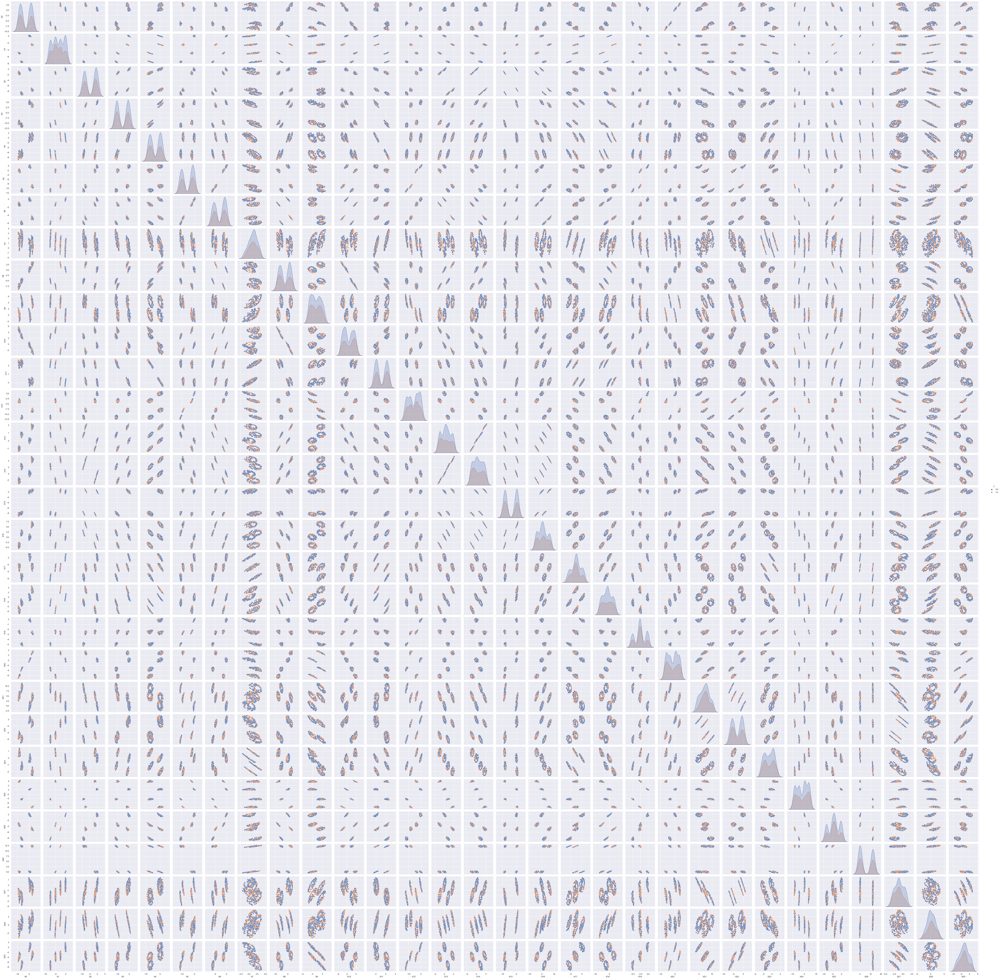

In [4]:
# Выберем для тренировки только часть данных

sns.pairplot(data=data.sample(n=500), hue='T')

    Кое-где отчетливо видны странные кластеры и сильные корреляции

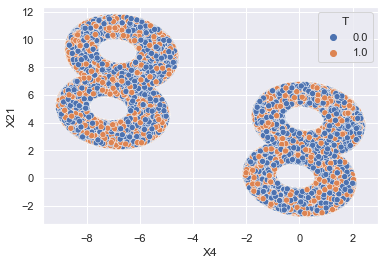

In [5]:
sns.scatterplot(data=data, x='X4', y='X21', hue='T')
plt.show()

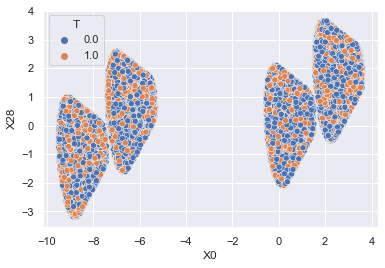

In [6]:
sns.scatterplot(data=data, x='X0', y='X28', hue='T')
plt.show()

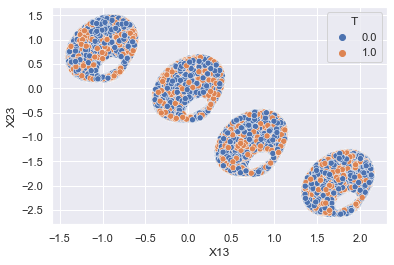

In [7]:
sns.scatterplot(data=data, x='X13', y='X23', hue='T')
plt.show()

    Пропущенные значения?
   

In [8]:
print(data.isna().sum().sum())

0


    Разделение данных

In [9]:
# Полный набор данных. Разделение на 3 части.
x_train, x_test, y_train, y_test = train_test_split(x_full, y_full, random_state=42)
x_test, x_valid, y_test, y_valid = train_test_split(x_test, y_test, test_size=0.5, 
                                                    random_state=42)

# Небольшая часть данных для тестирования кода
data_sample = data.sample(frac=0.3)
x_sample = data_sample.drop('T', axis='columns')
y_sample = data_sample['T']
x_train_sample, x_test_sample, y_train_sample, y_test_sample = (
    train_test_split(x_sample, y_sample, random_state=1))

print(f'X_train (sample) shape = {x_train_sample.shape}, X_test (sample) shape = {x_test_sample.shape}')
print(f'X_train shape = {x_train.shape}, X_test shape = {x_test.shape}'
      f', X_valid shape = {x_valid.shape}')


X_train (sample) shape = (82179, 30), X_test (sample) shape = (27394, 30)
X_train shape = (273933, 30), X_test shape = (45655, 30), X_valid shape = (45656, 30)


### 2. Некоторые способы интерпретировать результаты классификации (обзор):
 - PermutationImportance
 - DecisionTreeClassifier
 - Partial dependence plots
 - SHAP values

In [10]:
rfс_model = RandomForestClassifier(n_estimators=30, random_state=1,
                                   n_jobs=-1).fit(x_train_sample, y_train_sample)

    Permutation importance for the features

In [ ]:
# ! pip install eli5

In [11]:
perm = PermutationImportance(rfс_model, random_state=1).fit(x_train_sample, y_train_sample)

In [12]:
eli5.show_weights(perm, feature_names=x_train_sample.columns.tolist(), top=40)

Weight,Feature
0.1003 ± 0.0007,X2
0.0825 ± 0.0014,X12
0.0811 ± 0.0016,X23
0.0810 ± 0.0008,X20
0.0799 ± 0.0013,X6
0.0736 ± 0.0007,X3
0.0723 ± 0.0006,X8
0.0717 ± 0.0012,X27
0.0612 ± 0.0005,X17
0.0401 ± 0.0009,X9


    Decision tree plot

In [13]:
tree_model = DecisionTreeClassifier(random_state=1, max_depth=5, 
                                    min_samples_split=10).fit(x_train_sample, y_train_sample)

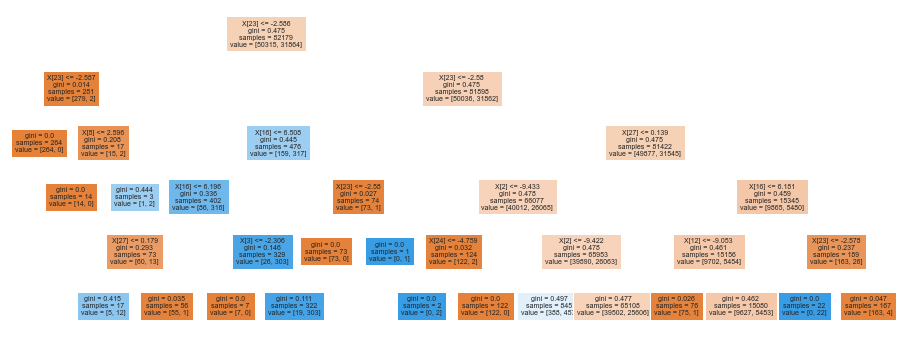

In [14]:
plt.figure(figsize=(16, 6))
tree.plot_tree(tree_model, filled=True, fontsize=7)
plt.show()

    Partial dependence plots

In [ ]:
# ! pip install pdpbox

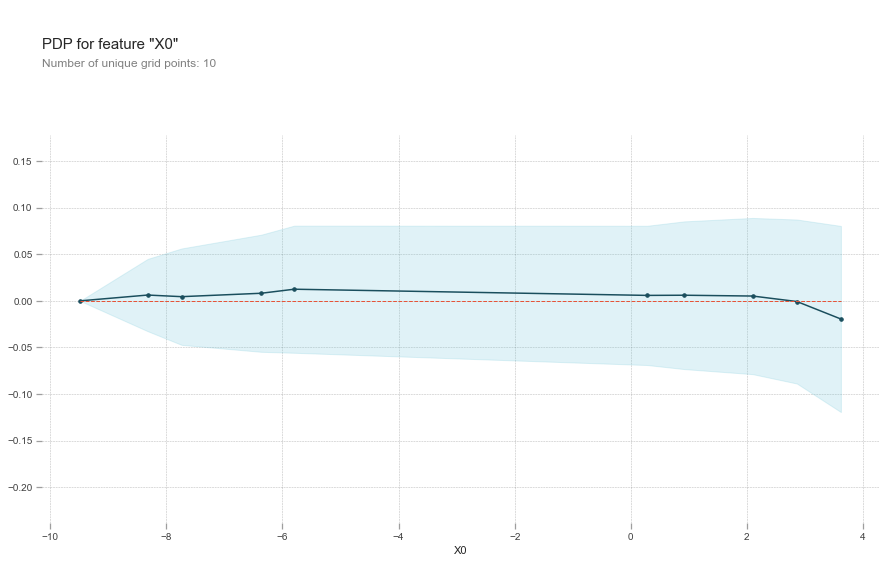

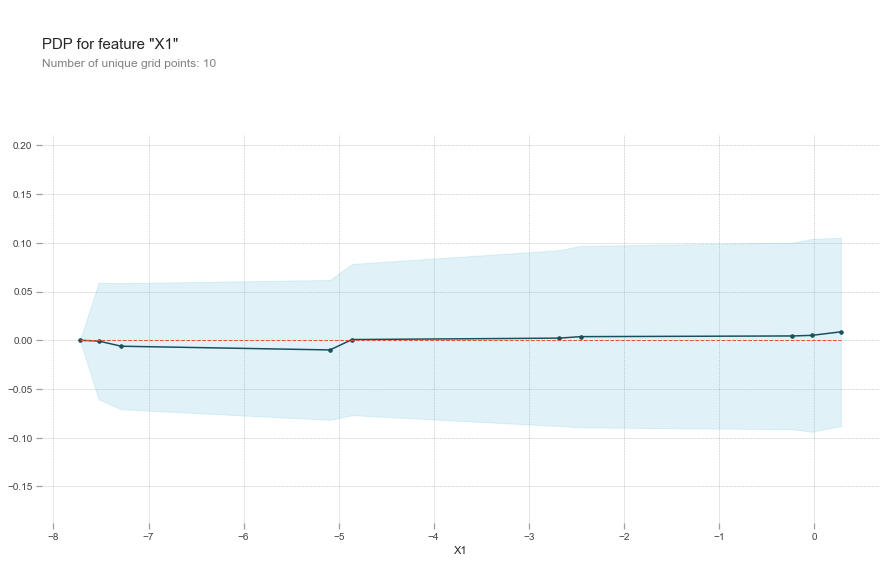

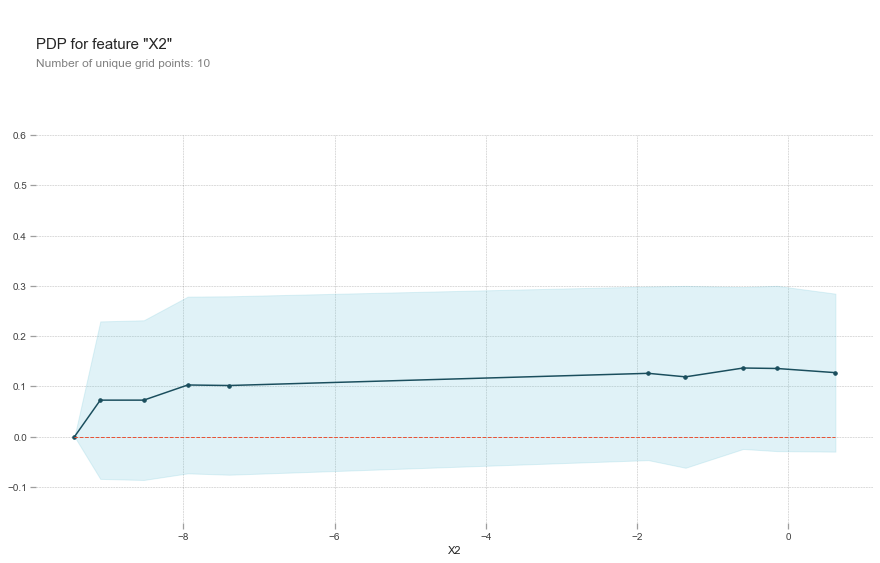

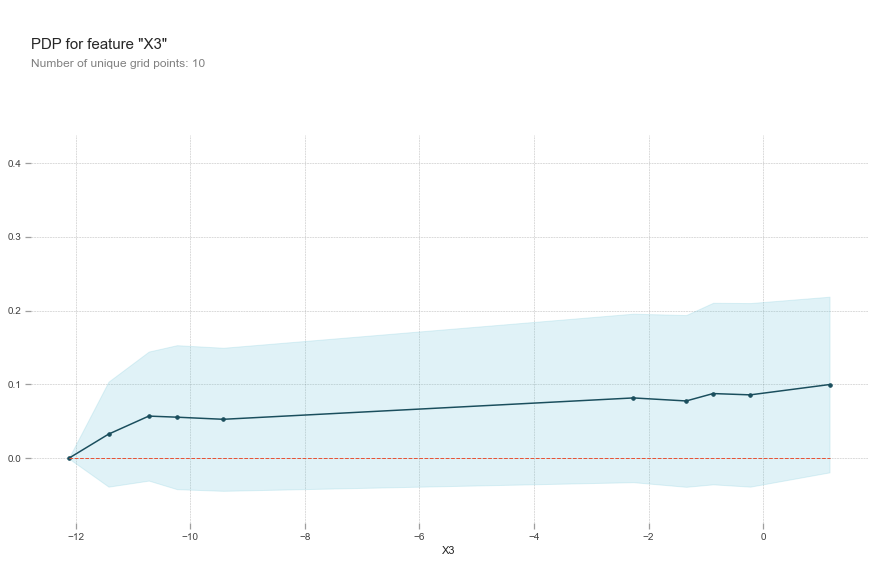

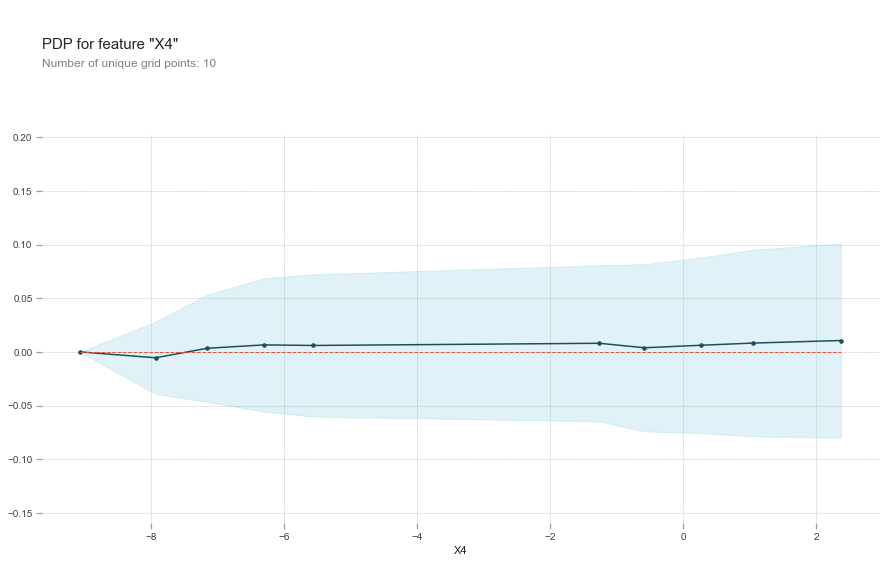

...

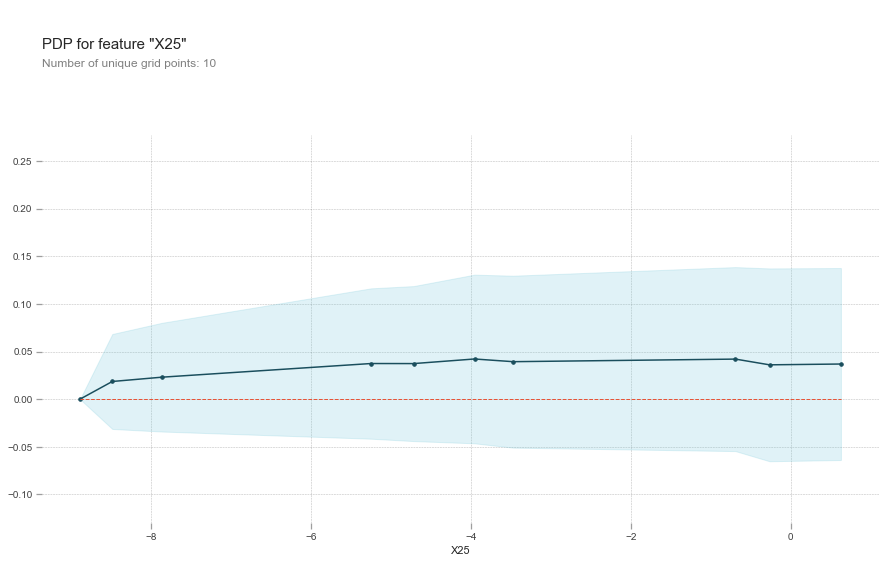

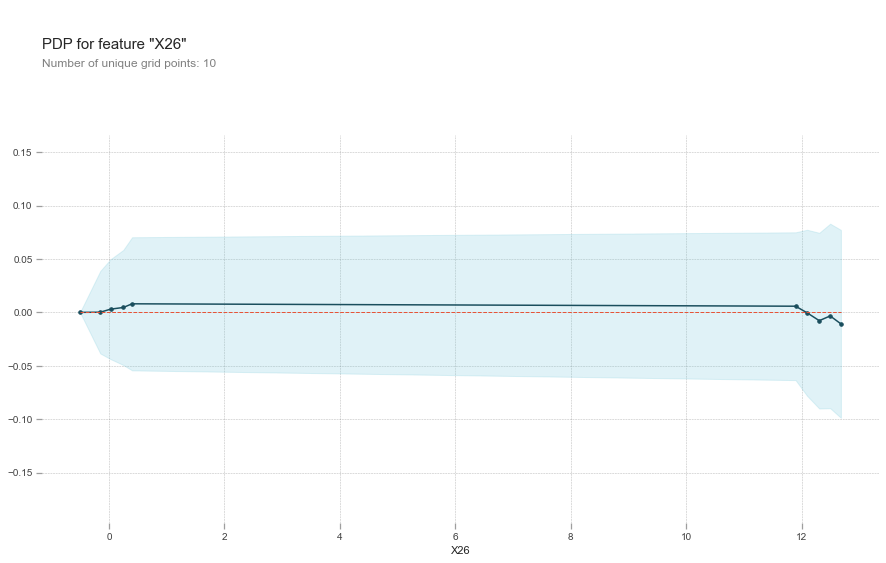

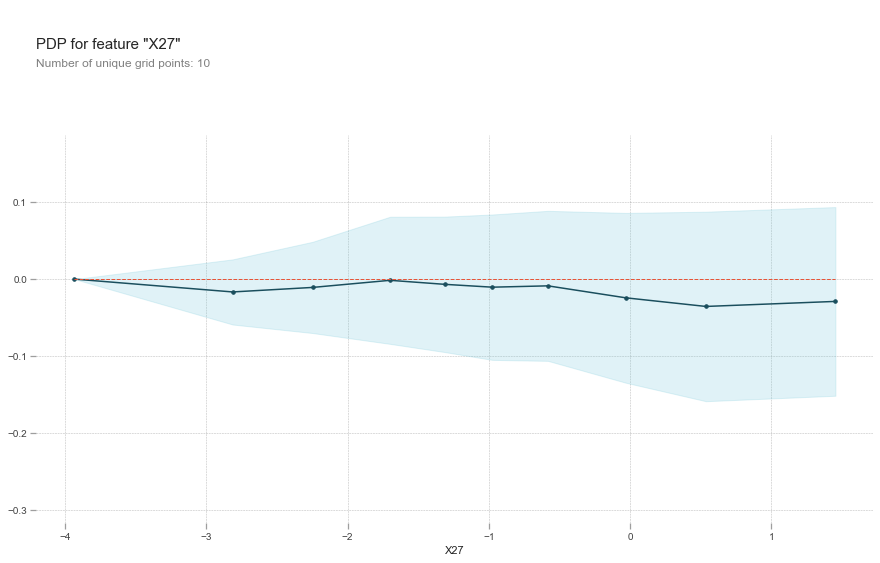

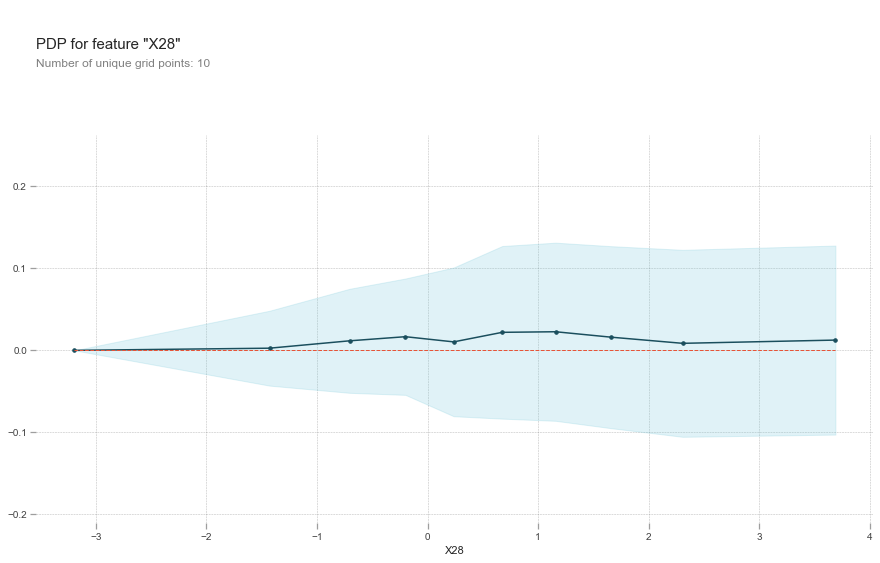

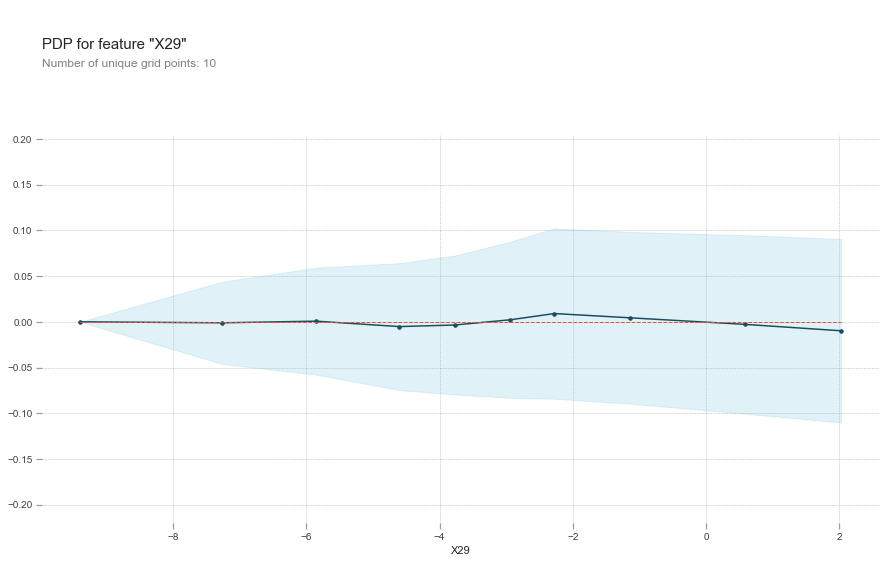

In [18]:
for selected_feature in x_train_sample.columns.to_list():
    pdp_dist = pdp.pdp_isolate(model=rfс_model, 
                               dataset=x_test_sample, 
                               model_features=x_train_sample.columns.to_list(), 
                               feature=selected_feature)    
    pdp.pdp_plot(pdp_dist, selected_feature)
    plt.show()

    SHAP values

In [ ]:
# ! pip install shap

In [ ]:
# Для небольшой части данных

n_rows = 1000
data_for_prediction = x_test_sample.sample(n=n_rows, random_state=1)

explainer = shap.TreeExplainer(rfс_model)
shap_values = explainer.shap_values(data_for_prediction)

In [28]:
# Для удобства вывод для 100 событий

shap.initjs()
shap.force_plot(explainer.expected_value[1], 
                shap_values[1][:100], 
                data_for_prediction[:100])

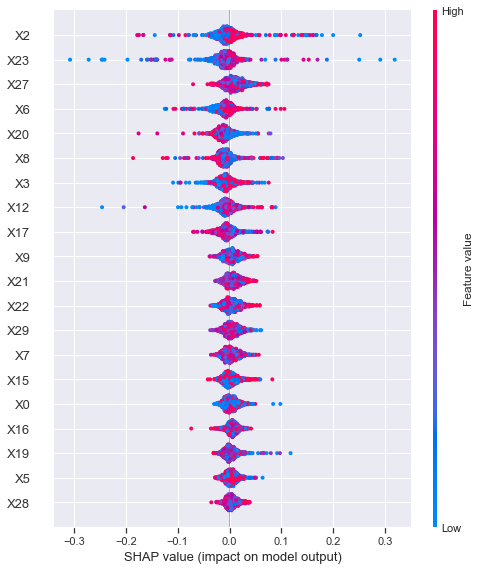

In [26]:
shap.summary_plot(shap_values[1], data_for_prediction)

### 3. Построение и выбор моделей

In [30]:
def evaluate(y_true, y_predicted):
    f1_ = f1_score(y_true, y_predicted)
    recall_ = recall_score(y_true, y_predicted)
    precision_ = precision_score(y_true, y_predicted)
    roc_auc_ = roc_auc_score(y_true, y_predicted)
    
    return f1_, recall_, precision_, roc_auc_

def predict(model, x_train, y_train, x_test, *args, **kwargs):
    if args is None:
        args = []
    if kwargs is None:
        kwargs = dict()
    predict_model = model(*args, **kwargs)
    predict_model.fit(x_train, y_train)
    y_pred = predict_model.predict(x_test)
    return y_pred

def plot_model_prediction(y_true, y_pred, title=None):
    ax = sns.kdeplot(x=y_true, color='r', label='Actual value')
    sns.kdeplot(x=y_pred, color='b', label='Predicted value', ax=ax)
    plt.legend()
    if not title is None:
        ax.set(title=title)
    plt.show()
    return ax

def compare_scores(y_true, y_pred, model_name=None, columns=None):
    if columns is None:
        columns=['model', 'F1', 'Recall', 'Precision', 'ROC AUC']
    if model_name is None:
        model_name = 'Some classifier'
    df_scores = pd.DataFrame(columns=columns)
    results_append = pd.DataFrame(data=[[model_name, *evaluate(y_true, y_pred)]], 
                                  columns=df_scores.columns)
    df_scores = df_scores.append(results_append, ignore_index=True)
    
    return df_scores
            
def compare_models(x_train, y_train, x_test, y_test, models, models_params=None,
                   show=True):
    columns=['model', 'F1', 'Recall', 'Precision', 'ROC AUC']
    df_scores = pd.DataFrame(columns=columns)
    if models_params is None: 
        models_params = dict()
    for model in models:
        if model in models_params:
            params = models_params.get(model)
            y_pred = predict(model, x_train, y_train, x_test, **params)
        else:
            y_pred = predict(model, x_train, y_train, x_test)
        score = compare_scores(y_test, y_pred, model_name=model.__name__)
        if show:
            plot_model_prediction(y_test, y_pred, title=model.__name__)
        print(f'{model.__name__} finished')
        df_scores = pd.concat([df_scores, score])
        
    return df_scores

#### Сравнение различных классификационных моделей на части тренировочных данных

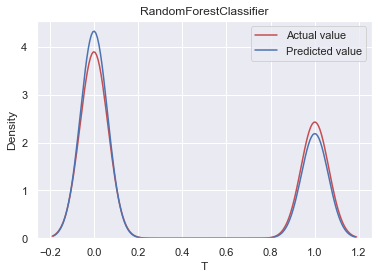

RandomForestClassifier finished


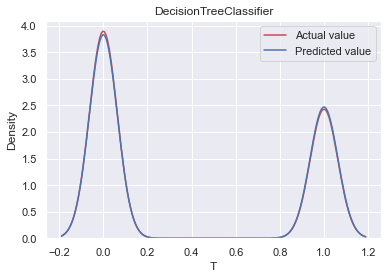

DecisionTreeClassifier finished


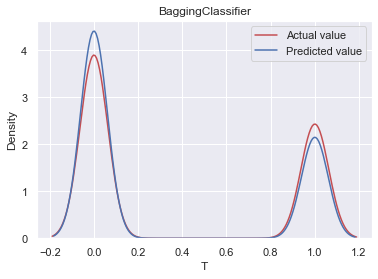

BaggingClassifier finished


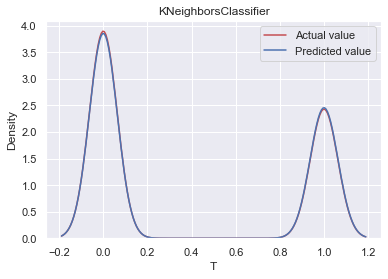

KNeighborsClassifier finished


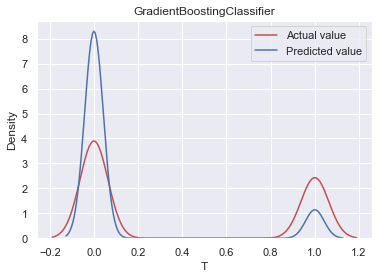

GradientBoostingClassifier finished


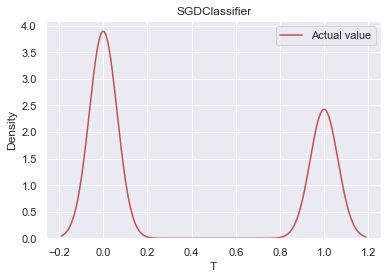

SGDClassifier finished


In [28]:
list_of_models = [
    RandomForestClassifier, 
    DecisionTreeClassifier, 
    BaggingClassifier,
    KNeighborsClassifier,
    GradientBoostingClassifier,
    SGDClassifier
]
dict_of_params = {
    RandomForestClassifier: {'n_jobs': -1},
    BaggingClassifier: {'n_jobs': -1},
    KNeighborsClassifier: {'n_jobs': -1},
    GradientBoostingClassifier: {'tol': 1e-2, 'learning_rate': 1.},
    SGDClassifier: {'random_state': 3}
}

df_scores = compare_models(x_train_sample, y_train_sample, x_test_sample, y_test_sample, 
                           models=list_of_models, 
                           models_params=dict_of_params)

In [29]:
df_scores

,model,F1,Recall,Precision,ROC AUC
0,RandomForestClassifier,0.707004,0.662548,0.757856,0.765285
0,DecisionTreeClassifier,0.757949,0.765875,0.750186,0.803436
0,BaggingClassifier,0.789188,0.731274,0.857063,0.827620
0,KNeighborsClassifier,0.375395,0.377947,0.372878,0.490828
0,GradientBoostingClassifier,0.294347,0.193536,0.614363,0.558899
0,SGDClassifier,0.000000,0.000000,0.000000,0.500000


#### Сравнение лучших моделей на всех тренировочных данных

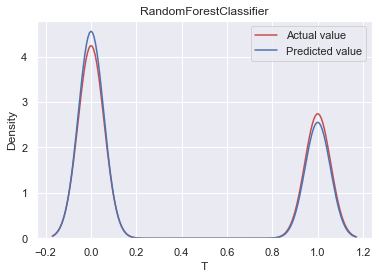

RandomForestClassifier finished


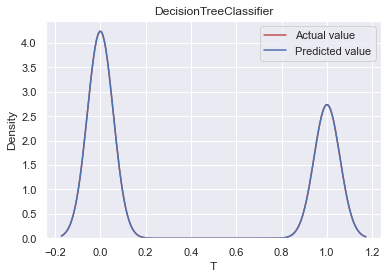

DecisionTreeClassifier finished


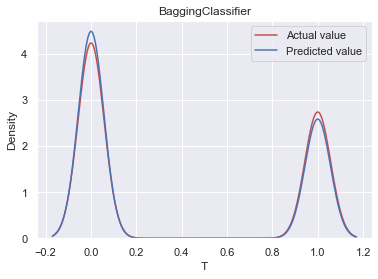

BaggingClassifier finished


In [31]:
list_of_models = [
    RandomForestClassifier, DecisionTreeClassifier, BaggingClassifier
]
dict_of_params = {
    RandomForestClassifier: {'n_jobs': -1},
    BaggingClassifier: {'n_jobs': -1},
}
df_scores = compare_models(x_train, y_train, x_test, y_test, 
                           models=list_of_models, 
                           models_params=dict_of_params)

In [32]:
df_scores

,model,F1,Recall,Precision,ROC AUC
0,RandomForestClassifier,0.909695,0.870795,0.952233,0.921279
0,DecisionTreeClassifier,0.895986,0.895286,0.896687,0.914304
0,BaggingClassifier,0.945313,0.912748,0.980288,0.950442


##### Вывод: Самой высокой оценки достигает модель "Bagging"

    BaggingClassifier scores (data sample)
     F1        0.945
     Recall    0.913
     Precision 0.98
     ROC AUC   0.95

#### Перебор параметров для предсказания лучшей модели на части  тренировочных данных

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 tasks      | elapsed:  8.7min
[Parallel(n_jobs=-1)]: Done  30 out of  30 | elapsed: 20.5min finished


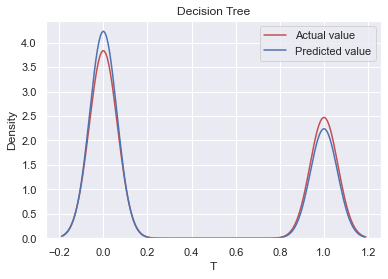

,model,F1,Recall,Precision,ROC AUC
0,BaggingClassifier,0.819513,0.771711,0.873629,0.849905


In [77]:
estimator = BaggingClassifier()
param_grid = {
#     'base_estimator': [SVC(), DecisionTreeClassifier()],
    'n_estimators': [5, 10, 15, 20, 25, 30],
#     'max_samples': [0.2, 0.7, 1.],
#     'max_features': [13, 15, 20, 25, 1.0],
    'n_jobs': [-1],
    'random_state': [42]
}

grid = GridSearchCV(estimator, param_grid, n_jobs=-1, verbose=3)
grid.fit(x_train_sample, y_train_sample)

y_pred = grid.best_estimator_.predict(x_test_sample)

df_scores = compare_scores(y_test_sample, y_test_pred, model_name='BaggingClassifier')
plot_model_prediction(y_test_sample, y_test_pred, title='Decision Tree')

df_scores

    Основное влияние имеет параметр 'n_estimators'. Другие признаки, 
    'max_samples' и 'max_features', стремятся к максимальному значению

In [79]:
grid.best_params_

{'n_estimators': 30, 'n_jobs': -1, 'random_state': 42}

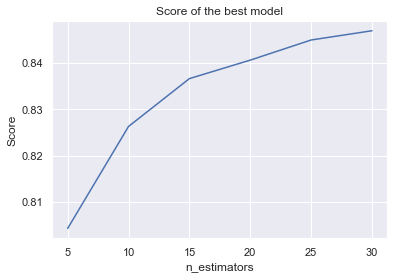

In [86]:
ax = sns.lineplot(
    param_grid['n_estimators'],
    grid.cv_results_['mean_test_score']
)
ax.set_title('Score of the best model')
ax.set_xlabel('n_estimators')
ax.set_ylabel('Score')
plt.show()

    Повышение параметра больше 30 не даст ощутимого улучшения

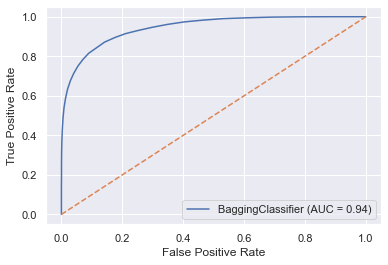

In [87]:
plot_roc_curve(grid.best_estimator_, x_test_sample, y_test_sample)
plt.plot([0, 1], [0, 1], linestyle='--', )
plt.show()

### 4. Получение итоговой оценки на всех данных

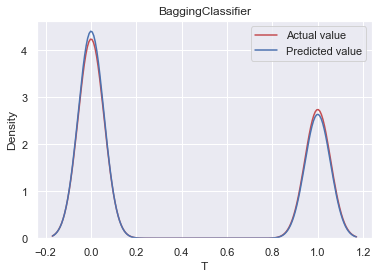

BaggingClassifier finished


In [32]:
list_of_models = [
    BaggingClassifier
]
dict_of_params = {
    BaggingClassifier: {'n_estimators': 30, 'n_jobs': -1, 'random_state': 42}
}
df_scores = compare_models(x_train, y_train, x_test, y_test, 
                           models=list_of_models, 
                           models_params=dict_of_params)

In [33]:
df_scores

,model,F1,Recall,Precision,ROC AUC
0,BaggingClassifier,0.964962,0.942594,0.988417,0.967727


##### Итоговая оценка 
    F1 = 0.965
    ROC AUC = 0.968

#### Дополнительно: проверка рекомендации о возможности установки библиотек с помощью conda

In [34]:
! conda search -c conda-forge pdpbox

Loading channels: ...working... done
# Name                       Version           Build  Channel             
pdpbox                         0.2.0            py_0  conda-forge         


In [35]:
! conda search -c conda-forge eli5

Loading channels: ...working... done
# Name                       Version           Build  Channel             
eli5                             0.6          py27_0  conda-forge         
eli5                             0.6          py35_0  conda-forge         
eli5                             0.6          py36_0  conda-forge         
eli5                           0.6.1          py27_0  conda-forge         
eli5                           0.6.1          py35_0  conda-forge         
eli5                           0.6.1          py36_0  conda-forge         
eli5                             0.7          py27_0  conda-forge         
eli5                             0.7          py35_0  conda-forge         
eli5                             0.7          py36_0  conda-forge         
eli5                             0.8            py_0  conda-forge         
eli5                           0.8.1            py_0  conda-forge         
eli5                           0.8.2            py_0  conda-for